# Dogs vs. Cats

https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition

In [1]:
import numpy as np
import keras
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.image import random_brightness,random_rotation,random_shear,random_shift,random_zoom
#from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
#from tensorflow.python.keras.models import Sequential
#from tensorflow.python.keras.layers import Activation, Dropout, Flatten, Dense
#from tensorflow.python.keras.applications import VGG16
from keras.optimizers import Adam
from keras import layers, models, optimizers
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Conv2D, MaxPooling2D
from tensorflow.python.keras.layers import Activation, Dropout, Flatten, Dense

Using TensorFlow backend.


In [2]:
IMG_SIZE = (224, 224)  # размер входного изображения сети

## Функции загрузки данных

In [4]:
import re
from random import shuffle
from glob import glob

train_files = glob('./input/train/*.jpg')
test_files = glob('./input/test/*.jpg')

# загружаем входное изображение и предобрабатываем
def load_image(path, target_size=IMG_SIZE):
    img = load_img(path, target_size=target_size)  # загрузка и масштабирование изображения
    array = img_to_array(img)
    array/=255.
    #ImageDataGenerator(rescale=1. / 255)
    return  array#preprocess_input(array)  # предобработка для VGG16

# генератор для последовательного чтения обучающих данных с диска
def fit_generator(files, batch_size=32):
    while True:
        shuffle(files)
        for k in range(len(files) // batch_size):
            i = k * batch_size
            j = i + batch_size
            if j > len(files):
                j = - j % len(files)
            x = np.array([load_image(path) for path in files[i:j]])
            y = np.array([1. if re.match('.*/dog\.\d', path) else 0. for path in files[i:j]])
            yield (x, y)

# генератор последовательного чтения тестовых данных с диска
def predict_generator(files):
    while True:
        for path in files:
            yield np.array([load_image(path)])

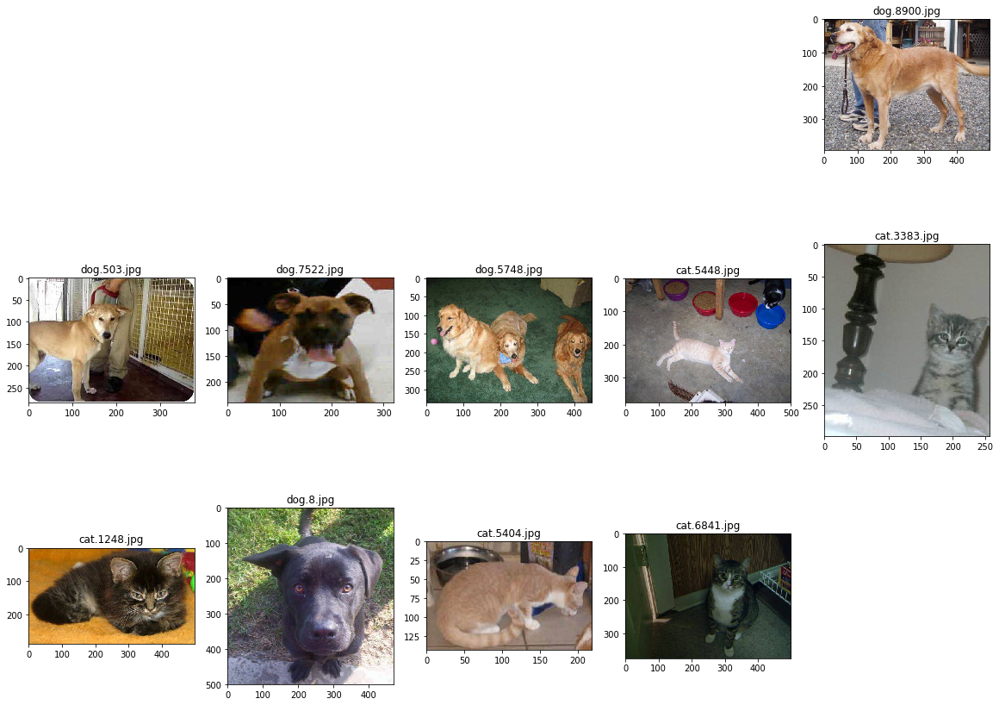

In [5]:
%matplotlib inline
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(20, 20))
for i, path in enumerate(train_files[:10], 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    plt.imshow(plt.imread(path));
    subplot.set_title('%s' % path.split('/')[-1]);

### Обучим для любопытства сначала свою сетку

In [7]:
model_just_cnn = Sequential()
model_just_cnn.add(Conv2D(32, (3, 3), input_shape=input_shape))
model_just_cnn.add(Activation('relu'))
model_just_cnn.add(MaxPooling2D(pool_size=(2, 2)))

model_just_cnn.add(Conv2D(32, (3, 3)))
model_just_cnn.add(Activation('relu'))
model_just_cnn.add(MaxPooling2D(pool_size=(2, 2)))

model_just_cnn.add(Conv2D(64, (3, 3)))
model_just_cnn.add(Activation('relu'))
model_just_cnn.add(MaxPooling2D(pool_size=(2, 2)))

model_just_cnn.add(Flatten())
model_just_cnn.add(Dense(64))
model_just_cnn.add(Activation('relu'))
model_just_cnn.add(Dropout(0.5))
model_just_cnn.add(Dense(1))
model_just_cnn.add(Activation('sigmoid'))

In [8]:
model_just_cnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 222, 222, 32)      896       
_________________________________________________________________
activation (Activation)      (None, 222, 222, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 109, 109, 32)      9248      
_________________________________________________________________
activation_1 (Activation)    (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 54, 54, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 52, 52, 64)        18496     
__________

In [10]:
model_just_cnn.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [11]:
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_just_cnn = model_just_cnn.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 3s 344ms/step - loss: 0.7730 - acc: 0.5500 - val_loss: 0.7100 - val_acc: 0.3500
Epoch 2/120
10/10 [==============================] - 1s 100ms/step - loss: 0.6858 - acc: 0.5563 - val_loss: 0.7165 - val_acc: 0.3500
Epoch 3/120
10/10 [==============================] - 1s 136ms/step - loss: 0.6942 - acc: 0.4781 - val_loss: 0.6907 - val_acc: 0.5400
Epoch 4/120
10/10 [==============================] - 1s 141ms/step - loss: 0.6913 - acc: 0.5719 - val_loss: 0.6804 - val_acc: 0.6200
Epoch 5/120
10/10 [==============================] - 1s 141ms/step - loss: 0.6960 - acc: 0.5000 - val_loss: 0.7109 - val_acc: 0.3500
Epoch 6/120
10/10 [==============================] - 1s 139ms/step - loss: 0.6921 - acc: 0.5031 - val_loss: 0.6973 - val_acc: 0.3800
Epoch 7/120
10/10 [==============================] - 1s 139ms/step - loss: 0.6805 - acc: 0.5531 - val_loss: 0.7119 - val_acc: 0.3800
Epoch 8/120
10/10 [==============================] - 1s 135ms/step - 

10/10 [==============================] - 1s 140ms/step - loss: 0.6711 - acc: 0.6344 - val_loss: 0.6297 - val_acc: 0.7100
Epoch 63/120
10/10 [==============================] - 1s 132ms/step - loss: 0.6253 - acc: 0.6844 - val_loss: 0.6439 - val_acc: 0.6800
Epoch 64/120
10/10 [==============================] - 1s 138ms/step - loss: 0.6506 - acc: 0.6469 - val_loss: 0.6117 - val_acc: 0.7300
Epoch 65/120
10/10 [==============================] - 1s 138ms/step - loss: 0.6231 - acc: 0.6719 - val_loss: 0.5776 - val_acc: 0.7300
Epoch 66/120
10/10 [==============================] - 1s 138ms/step - loss: 0.5871 - acc: 0.7094 - val_loss: 0.5663 - val_acc: 0.7200
Epoch 67/120
10/10 [==============================] - 1s 137ms/step - loss: 0.5591 - acc: 0.7156 - val_loss: 0.7091 - val_acc: 0.5800
Epoch 68/120
10/10 [==============================] - 1s 142ms/step - loss: 0.6207 - acc: 0.6437 - val_loss: 0.5912 - val_acc: 0.7200
Epoch 69/120
10/10 [==============================] - 1s 142ms/step - loss:

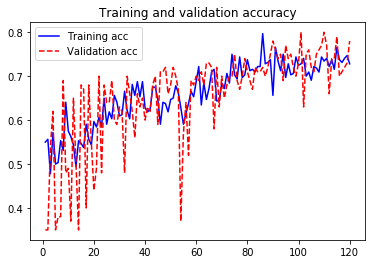

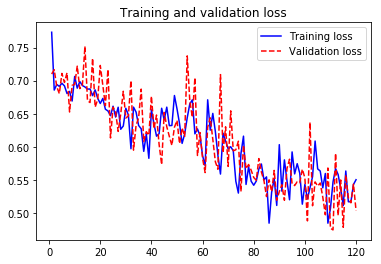

In [12]:
import matplotlib.pyplot as plt
acc = history_just_cnn.history['acc'] 
val_acc = history_just_cnn.history['val_acc'] 
loss = history_just_cnn.history['loss'] 
val_loss = history_just_cnn.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [13]:
predicts_just_cnn = model_just_cnn.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

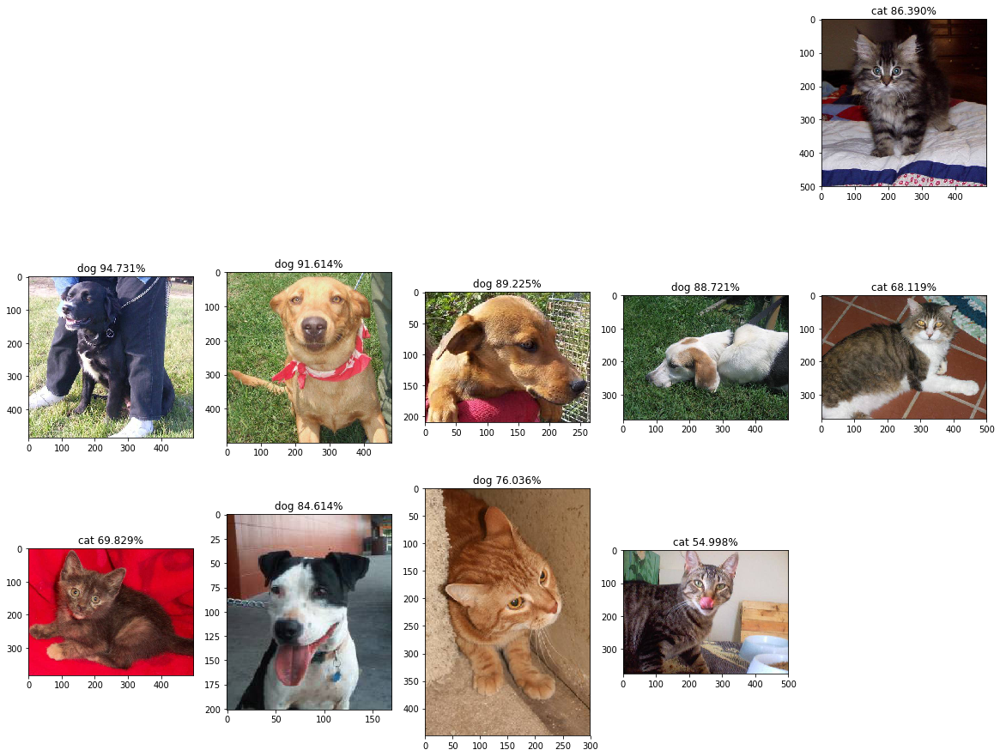

In [14]:
fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_just_cnn[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [15]:
with open('submit_just_cnn.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files, predicts_just_cnn):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

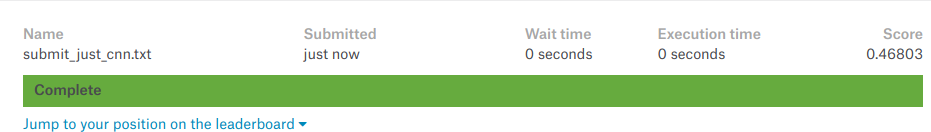

In [16]:
#ну не оч хороший результат
from IPython.display import Image
Image('submit_just_cnn.png')

### Поробуем добавить еще слой

In [13]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
model_2 = Sequential()
model_2.add(Conv2D(32, (3, 3), input_shape=input_shape))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))

model_2.add(Conv2D(32, (3, 3)))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))

model_2.add(Conv2D(64, (3, 3)))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))

model_2.add(Conv2D(64, (3, 3)))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))

model_2.add(Flatten())
model_2.add(Dense(64))
model_2.add(Activation('relu'))
model_2.add(Dropout(0.5))
model_2.add(Dense(1))
model_2.add(Activation('sigmoid'))

In [14]:
model_2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [15]:
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_just_cnn = model_2.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 3s 262ms/step - loss: 0.6978 - acc: 0.4719 - val_loss: 0.6869 - val_acc: 0.5500
Epoch 2/120
10/10 [==============================] - 1s 83ms/step - loss: 0.6973 - acc: 0.4719 - val_loss: 0.6939 - val_acc: 0.4500
Epoch 3/120
10/10 [==============================] - 1s 128ms/step - loss: 0.6930 - acc: 0.5250 - val_loss: 0.6936 - val_acc: 0.4500
Epoch 4/120
10/10 [==============================] - 1s 129ms/step - loss: 0.6919 - acc: 0.5375 - val_loss: 0.6956 - val_acc: 0.4500
Epoch 5/120
10/10 [==============================] - 1s 130ms/step - loss: 0.6943 - acc: 0.5031 - val_loss: 0.6934 - val_acc: 0.4800
Epoch 6/120
10/10 [==============================] - 1s 126ms/step - loss: 0.6845 - acc: 0.5812 - val_loss: 0.6961 - val_acc: 0.5500
Epoch 7/120
10/10 [==============================] - 1s 131ms/step - loss: 0.6695 - acc: 0.5750 - val_loss: 0.6926 - val_acc: 0.4700
Epoch 8/120
10/10 [==============================] - 1s 136ms/step - l

10/10 [==============================] - 1s 129ms/step - loss: 0.5711 - acc: 0.7219 - val_loss: 0.5612 - val_acc: 0.7500
Epoch 63/120
10/10 [==============================] - 1s 130ms/step - loss: 0.5802 - acc: 0.7000 - val_loss: 0.5375 - val_acc: 0.7400
Epoch 64/120
10/10 [==============================] - 1s 132ms/step - loss: 0.6087 - acc: 0.6875 - val_loss: 0.5907 - val_acc: 0.6700
Epoch 65/120
10/10 [==============================] - 1s 124ms/step - loss: 0.5113 - acc: 0.7406 - val_loss: 0.5230 - val_acc: 0.7300
Epoch 66/120
10/10 [==============================] - 1s 129ms/step - loss: 0.5411 - acc: 0.7375 - val_loss: 0.5235 - val_acc: 0.7300
Epoch 67/120
10/10 [==============================] - 1s 127ms/step - loss: 0.5495 - acc: 0.7188 - val_loss: 0.5389 - val_acc: 0.7200
Epoch 68/120
10/10 [==============================] - 1s 128ms/step - loss: 0.5557 - acc: 0.7125 - val_loss: 0.5161 - val_acc: 0.7600
Epoch 69/120
10/10 [==============================] - 1s 132ms/step - loss:

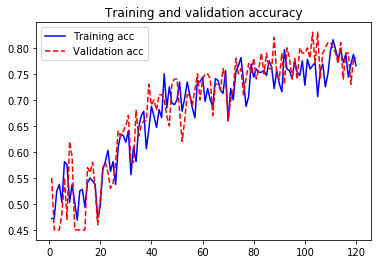

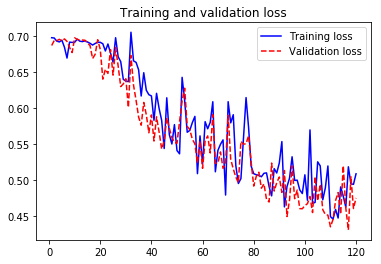

In [16]:
acc = history_just_cnn.history['acc'] 
val_acc = history_just_cnn.history['val_acc'] 
loss = history_just_cnn.history['loss'] 
val_loss = history_just_cnn.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [31]:
predicts_2 = model_2.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)





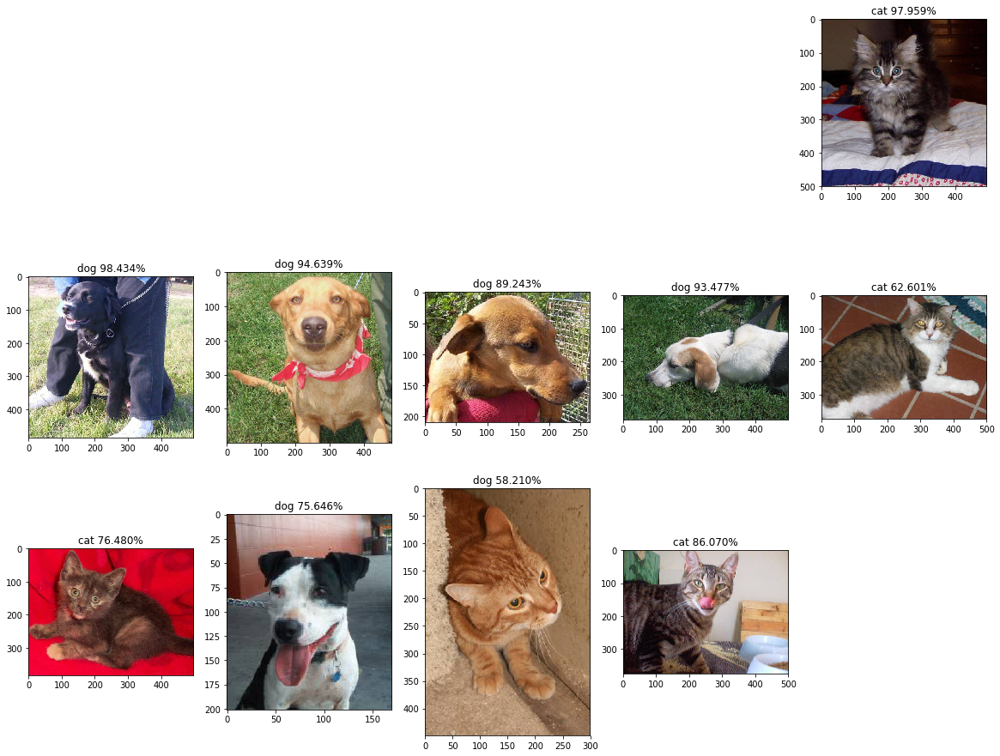

In [32]:

fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_2[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [33]:
with open('submit_2.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files, predicts_just_cnn):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))


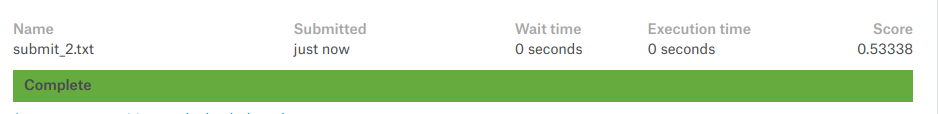

In [36]:
#даже хуже стала обощаться
Image('submit_2.png')

### Попробуем еще какую-нибудь архитектуру, добавим в нее BatchNormalizaцию

In [17]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization



model_cnn_batchnorm = Sequential()

model_cnn_batchnorm.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model_cnn_batchnorm.add(BatchNormalization())
model_cnn_batchnorm.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_batchnorm.add(Dropout(0.25))

model_cnn_batchnorm.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn_batchnorm.add(BatchNormalization())
model_cnn_batchnorm.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_batchnorm.add(Dropout(0.25))

model_cnn_batchnorm.add(Conv2D(128, (3, 3), activation='relu'))
model_cnn_batchnorm.add(BatchNormalization())
model_cnn_batchnorm.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_batchnorm.add(Dropout(0.25))

model_cnn_batchnorm.add(Flatten())
model_cnn_batchnorm.add(Dense(512, activation='relu'))
model_cnn_batchnorm.add(BatchNormalization())
model_cnn_batchnorm.add(Dropout(0.5))
model_cnn_batchnorm.add(Dense(1, activation='sigmoid'))

model_cnn_batchnorm.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model_cnn_batchnorm.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
batch_normalization_1 (Batch (None, 222, 222, 32)      128       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
batch_normalization_2 (Batch (None, 109, 109, 64)      256       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 54, 54, 64)        0         
__________

In [18]:
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_cnn_batchnorm = model_cnn_batchnorm.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 3s 267ms/step - loss: 1.3886 - acc: 0.5031 - val_loss: 7.2045 - val_acc: 0.4200
Epoch 2/120
10/10 [==============================] - 1s 85ms/step - loss: 1.0506 - acc: 0.5344 - val_loss: 2.9105 - val_acc: 0.4500
Epoch 3/120
10/10 [==============================] - 1s 85ms/step - loss: 0.9382 - acc: 0.5844 - val_loss: 2.5042 - val_acc: 0.5200
Epoch 4/120
10/10 [==============================] - 1s 128ms/step - loss: 0.9132 - acc: 0.5750 - val_loss: 4.8329 - val_acc: 0.4600
Epoch 5/120
10/10 [==============================] - 1s 135ms/step - loss: 1.0294 - acc: 0.5281 - val_loss: 2.4148 - val_acc: 0.5900
Epoch 6/120
10/10 [==============================] - 1s 138ms/step - loss: 0.9458 - acc: 0.5875 - val_loss: 2.8846 - val_acc: 0.5300
Epoch 7/120
10/10 [==============================] - 1s 127ms/step - loss: 0.9020 - acc: 0.6000 - val_loss: 1.8318 - val_acc: 0.4800
Epoch 8/120
10/10 [==============================] - 1s 133ms/step - lo

10/10 [==============================] - 1s 126ms/step - loss: 0.4795 - acc: 0.7844 - val_loss: 0.4979 - val_acc: 0.7000
Epoch 63/120
10/10 [==============================] - 1s 127ms/step - loss: 0.4550 - acc: 0.7594 - val_loss: 0.4999 - val_acc: 0.7700
Epoch 64/120
10/10 [==============================] - 1s 130ms/step - loss: 0.5320 - acc: 0.7156 - val_loss: 0.5851 - val_acc: 0.6600
Epoch 65/120
10/10 [==============================] - 1s 130ms/step - loss: 0.5495 - acc: 0.7438 - val_loss: 0.4658 - val_acc: 0.7600
Epoch 66/120
10/10 [==============================] - 1s 128ms/step - loss: 0.5490 - acc: 0.7031 - val_loss: 0.4962 - val_acc: 0.7400
Epoch 67/120
10/10 [==============================] - 1s 127ms/step - loss: 0.5310 - acc: 0.7656 - val_loss: 0.5301 - val_acc: 0.7400
Epoch 68/120
10/10 [==============================] - 1s 126ms/step - loss: 0.5491 - acc: 0.7375 - val_loss: 0.4877 - val_acc: 0.7800
Epoch 69/120
10/10 [==============================] - 1s 127ms/step - loss:

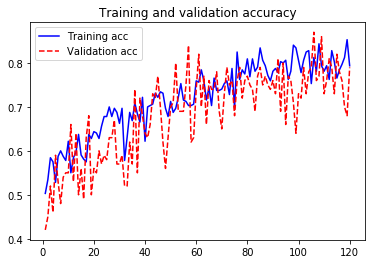

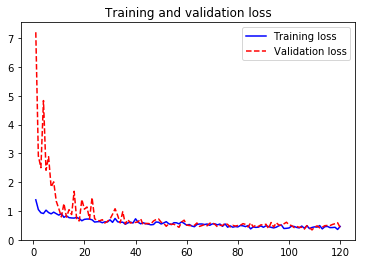

In [19]:
acc = history_cnn_batchnorm.history['acc'] 
val_acc = history_cnn_batchnorm.history['val_acc'] 
loss = history_cnn_batchnorm.history['loss'] 
val_loss = history_cnn_batchnorm.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [27]:
predicts_cnn_batchnorm= model_cnn_batchnorm.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

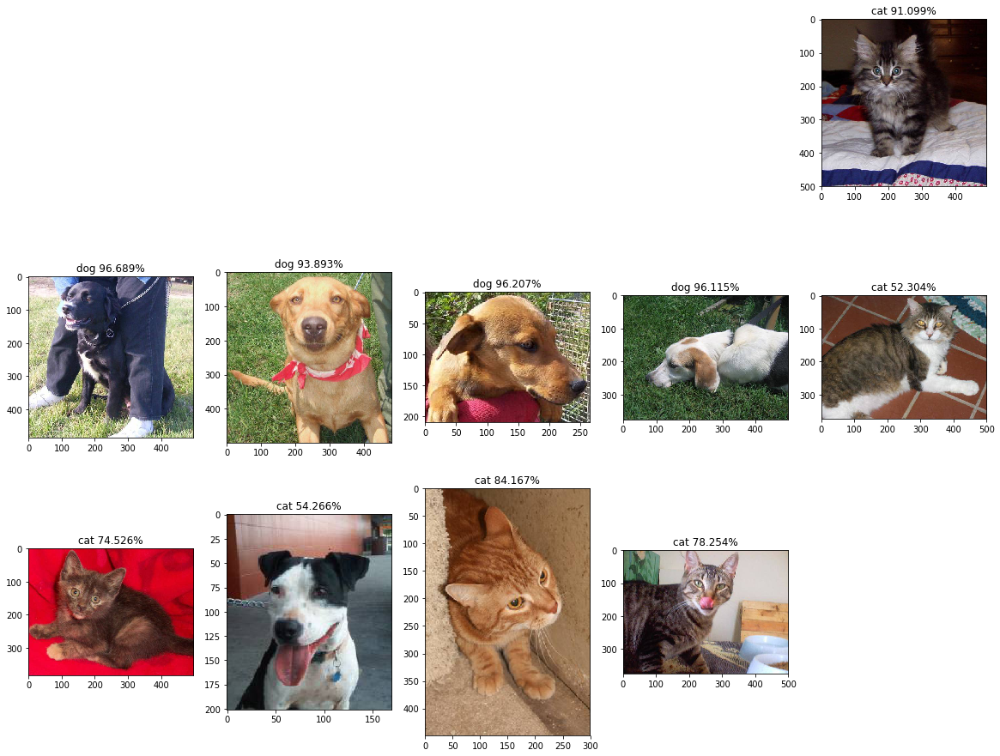

In [28]:
fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_cnn_batchnorm[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [29]:
with open('submit_cnn_batchnorm.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files, predicts_cnn_batchnorm):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

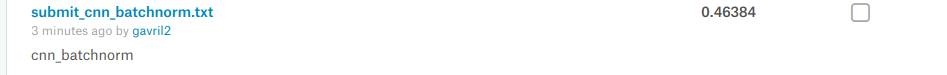

In [30]:
from IPython.display import Image
Image('submit_cnn_batchnorm.png')

### Попробуем добавить аугементированные картинки в предыдушую модель

In [20]:
def fit_aug_generator(files,batch_size=32, random_preproc=True,rotation_range=20, shear_range=0, shift_range=(0,0), zoom_range=(1,1)):
    while True:
        shuffle(files)
        #x=np.array([])
        #x = []
       # y = []
        for k in range(len(files) // batch_size):
            x = []
            y = []
           
            i = k * batch_size
            #print('i---',i)
            j = i + batch_size
            #print('j--',j)
            if j > len(files):
                j = - j % len(files)
            
            for path in files[i:j]:
                ##print(path)
                #print('________________________')
                img=load_image(path)
                label=1. if re.match('.*/dog\.\d', path) else 0.
                if random_preproc:
                        img = random_zoom(img, zoom_range,row_axis=0,col_axis=1,channel_axis=2)
                        img = random_shear(img, shear_range,row_axis=0,col_axis=1,channel_axis=2)
                        img = random_shift(img, shift_range[0],shift_range[1],row_axis=0,col_axis=1,channel_axis=2)
                        img = random_rotation(img, rotation_range,row_axis=0,col_axis=1,channel_axis=2)
                        #print('!!!!!!!!!!!!!!!!!!!!!!!!!!!',img.shape)
                        x.append(img)
                        y.append(label)
            yield np.array(x),np.array(y)

(4, 224, 224, 3) [1. 1. 1. 0.] 4
l 0


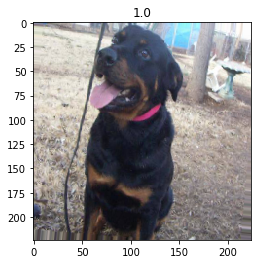

l 1


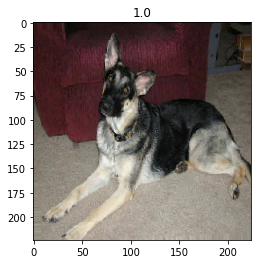

l 2


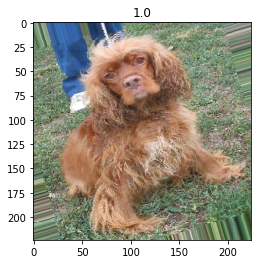

l 3


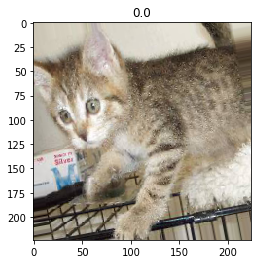

*****************************
(4, 224, 224, 3) [0. 0. 1. 1.] 4
l 0


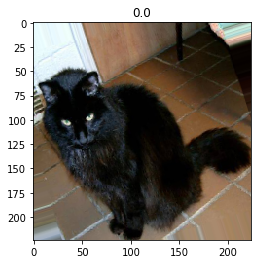

l 1


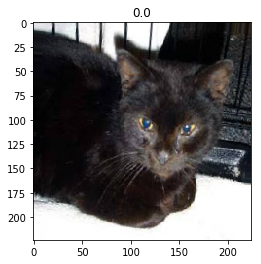

l 2


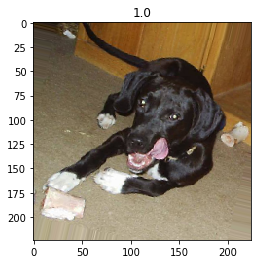

l 3


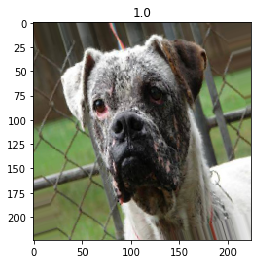

*****************************
(4, 224, 224, 3) [0. 1. 1. 1.] 4
l 0


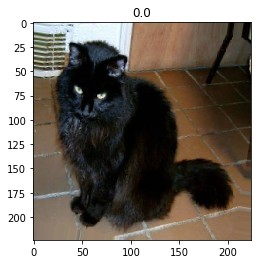

l 1


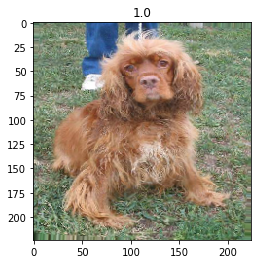

l 2


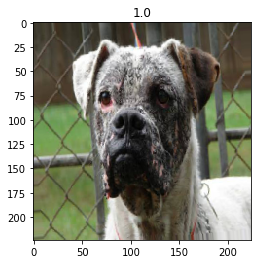

l 3


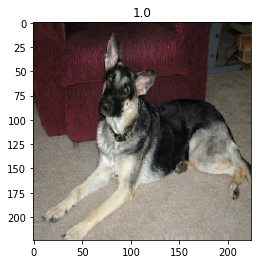

*****************************


In [21]:
i=0
for x,y in fit_aug_generator(train_files[:8],batch_size=4):
    print(x.shape,y,len(y))
    i += 1
    for k in range(len(y)):
        print('l',k)
        imgplot = plt.imshow(x[k])
        plt.title(y[k])
        plt.show()
    print('*****************************')
    if i>2:
        break

In [57]:
x.shape

(2, 224, 224, 3)

In [22]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization



model_cnn_batchnorm_aug = Sequential()

model_cnn_batchnorm_aug.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model_cnn_batchnorm_aug.add(BatchNormalization())
model_cnn_batchnorm_aug.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_batchnorm_aug.add(Dropout(0.25))

model_cnn_batchnorm_aug.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn_batchnorm_aug.add(BatchNormalization())
model_cnn_batchnorm_aug.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_batchnorm_aug.add(Dropout(0.25))

model_cnn_batchnorm_aug.add(Conv2D(128, (3, 3), activation='relu'))
model_cnn_batchnorm_aug.add(BatchNormalization())
model_cnn_batchnorm_aug.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_batchnorm_aug.add(Dropout(0.25))

model_cnn_batchnorm_aug.add(Flatten())
model_cnn_batchnorm_aug.add(Dense(512, activation='relu'))
model_cnn_batchnorm_aug.add(BatchNormalization())
model_cnn_batchnorm_aug.add(Dropout(0.5))
model_cnn_batchnorm_aug.add(Dense(1, activation='sigmoid'))

model_cnn_batchnorm_aug.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model_cnn_batchnorm_aug.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
batch_normalization_5 (Batch (None, 222, 222, 32)      128       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
batch_normalization_6 (Batch (None, 109, 109, 64)      256       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 54, 54, 64)        0         
__________

In [23]:
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_aug_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_cnn_batchnorm_aug = model_cnn_batchnorm_aug.fit_generator(fit_aug_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 4s 382ms/step - loss: 1.5330 - acc: 0.5687 - val_loss: 1.5502 - val_acc: 0.5300
Epoch 2/120
10/10 [==============================] - 3s 346ms/step - loss: 1.1764 - acc: 0.5469 - val_loss: 1.2895 - val_acc: 0.5100
Epoch 3/120
10/10 [==============================] - 4s 353ms/step - loss: 1.1610 - acc: 0.5250 - val_loss: 1.0374 - val_acc: 0.5200
Epoch 4/120
10/10 [==============================] - 4s 352ms/step - loss: 0.9270 - acc: 0.5906 - val_loss: 1.0442 - val_acc: 0.6500
Epoch 5/120
10/10 [==============================] - 3s 348ms/step - loss: 0.9497 - acc: 0.5875 - val_loss: 1.2013 - val_acc: 0.4900
Epoch 6/120
10/10 [==============================] - 3s 348ms/step - loss: 1.0184 - acc: 0.5812 - val_loss: 1.3187 - val_acc: 0.5300
Epoch 7/120
10/10 [==============================] - 4s 352ms/step - loss: 0.8479 - acc: 0.6000 - val_loss: 0.9368 - val_acc: 0.6300
Epoch 8/120
10/10 [==============================] - 3s 348ms/step - 

10/10 [==============================] - 4s 351ms/step - loss: 0.5286 - acc: 0.7531 - val_loss: 0.5484 - val_acc: 0.7200
Epoch 63/120
10/10 [==============================] - 4s 352ms/step - loss: 0.5099 - acc: 0.7438 - val_loss: 0.5627 - val_acc: 0.7200
Epoch 64/120
10/10 [==============================] - 4s 352ms/step - loss: 0.5205 - acc: 0.7500 - val_loss: 0.4714 - val_acc: 0.7700
Epoch 65/120
10/10 [==============================] - 3s 348ms/step - loss: 0.5456 - acc: 0.7344 - val_loss: 0.5527 - val_acc: 0.7200
Epoch 66/120
10/10 [==============================] - 3s 349ms/step - loss: 0.5708 - acc: 0.7469 - val_loss: 0.4964 - val_acc: 0.7800
Epoch 67/120
10/10 [==============================] - 4s 350ms/step - loss: 0.5474 - acc: 0.7438 - val_loss: 0.4674 - val_acc: 0.7800
Epoch 68/120
10/10 [==============================] - 3s 348ms/step - loss: 0.5326 - acc: 0.7094 - val_loss: 0.4818 - val_acc: 0.7800
Epoch 69/120
10/10 [==============================] - 3s 347ms/step - loss:

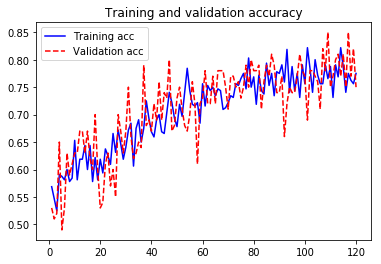

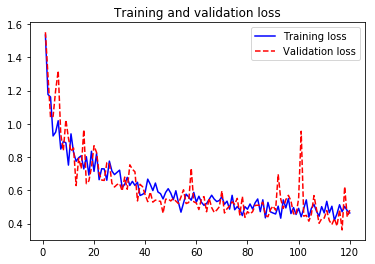

In [24]:
acc = history_cnn_batchnorm_aug.history['acc'] 
val_acc = history_cnn_batchnorm_aug.history['val_acc'] 
loss = history_cnn_batchnorm_aug.history['loss'] 
val_loss = history_cnn_batchnorm_aug.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [98]:
predicts_cnn_batchnorm_aug= model_cnn_batchnorm_aug.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

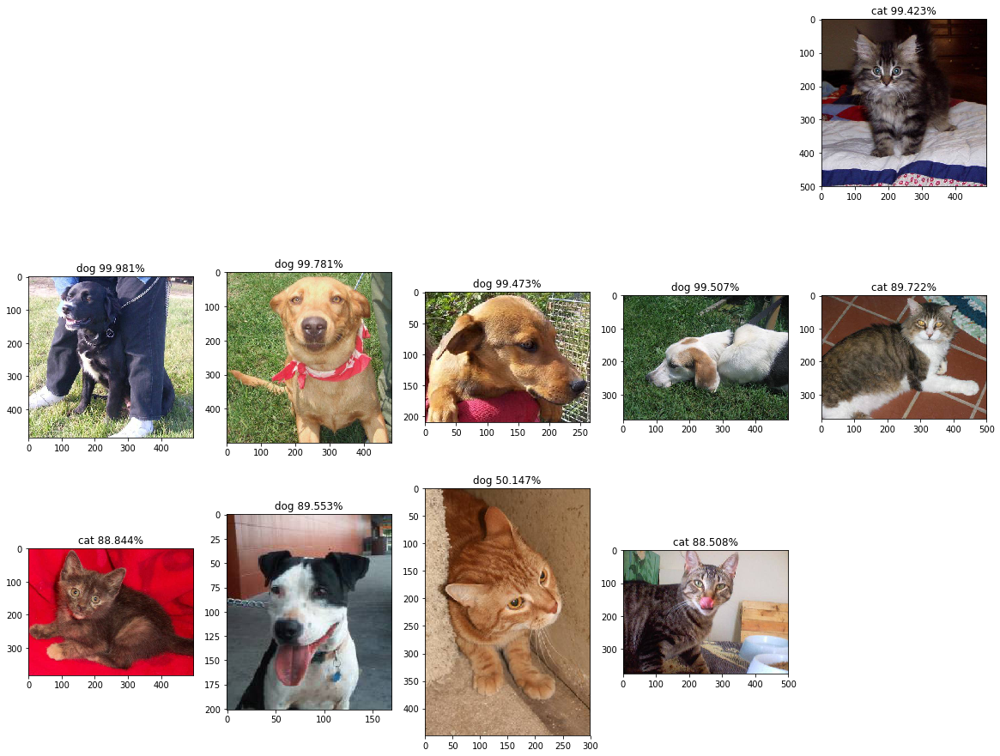

In [99]:
fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_cnn_batchnorm_aug[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [102]:
with open('submit_cnn_batchnorm_aug.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files, predicts_cnn_batchnorm_aug):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

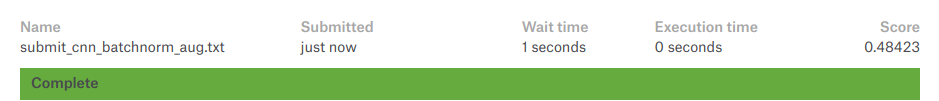

In [103]:
# Не сильно помогла аугементация
from IPython.display import Image
Image('submit_cnn_batchnorm_aug.png')

## VGG16

### Загружаем предобученную модель

In [5]:
IMG_SIZE=(224,224)

In [6]:
import keras as ks


In [7]:
# там какая-то ерунда с версиями закгрузим напрямую из кераса
from keras.applications.vgg16 import VGG16 as vgg_16

In [8]:
# base_model -  объект класса keras.models.Model (Functional Model)

vgg16 = vgg_16(include_top = False,
                   weights = 'imagenet',
                   input_shape = (IMG_SIZE[0], IMG_SIZE[1], 3))

In [9]:
# фиксируем все веса предобученной сети
for layer in vgg16.layers:
    layer.trainable = False

In [12]:
vgg16.trainable = False

In [13]:
vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

## Добавляем полносвязный слой

In [14]:
from keras.layers import Dense, Dropout, Flatten, Activation, BatchNormalization, regularizers
from keras import layers
model_vgg16 = ks.models.Sequential()
model_vgg16.add(vgg16)
model_vgg16.add(layers.Dropout(0.5))
model_vgg16.add(Flatten())
model_vgg16.add(Dense(512, activation='relu'))
model_vgg16.add(BatchNormalization())
model_vgg16.add(Dropout(0.5))
model_vgg16.add(Dense(1, activation='sigmoid'))

## Выводим архитектуру модели

In [15]:
model_vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7, 512)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               12845568  
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 513       
Total para

In [17]:
def load_image(path, target_size =(224,224)):
    img = load_img(path, target_size=target_size)  # загрузка и масштабирование изображения
    array = img_to_array(img)
    return preprocess_input(array)  # предобработка для VGG16

## Компилируем модель и запускаем обучение

In [24]:
model_vgg16.compile(optimizer='adam', 
              loss='binary_crossentropy',  # функция потерь binary_crossentropy (log loss
              metrics=['accuracy'])

In [25]:
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_vgg16 = model_vgg16.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 5s 516ms/step - loss: 0.4132 - acc: 0.8656 - val_loss: 0.8220 - val_acc: 0.8200
Epoch 2/120
10/10 [==============================] - 1s 137ms/step - loss: 0.1976 - acc: 0.9344 - val_loss: 0.1616 - val_acc: 0.9400
Epoch 3/120
10/10 [==============================] - 1s 135ms/step - loss: 0.1138 - acc: 0.9594 - val_loss: 0.1146 - val_acc: 0.9500
Epoch 4/120
10/10 [==============================] - 1s 136ms/step - loss: 0.0881 - acc: 0.9688 - val_loss: 0.0912 - val_acc: 0.9600
Epoch 5/120
10/10 [==============================] - 1s 135ms/step - loss: 0.1509 - acc: 0.9375 - val_loss: 0.0847 - val_acc: 0.9600
Epoch 6/120
10/10 [==============================] - 1s 136ms/step - loss: 0.2063 - acc: 0.9531 - val_loss: 0.0645 - val_acc: 0.9700
Epoch 7/120
10/10 [==============================] - 1s 136ms/step - loss: 0.1219 - acc: 0.9406 - val_loss: 0.0645 - val_acc: 0.9700
Epoch 8/120
10/10 [==============================] - 1s 135ms/step - 

10/10 [==============================] - 1s 136ms/step - loss: 0.0595 - acc: 0.9750 - val_loss: 0.0531 - val_acc: 0.9700
Epoch 63/120
10/10 [==============================] - 1s 137ms/step - loss: 0.0547 - acc: 0.9844 - val_loss: 0.0478 - val_acc: 0.9800
Epoch 64/120
10/10 [==============================] - 1s 136ms/step - loss: 0.0814 - acc: 0.9625 - val_loss: 0.0409 - val_acc: 0.9800
Epoch 65/120
10/10 [==============================] - 1s 136ms/step - loss: 0.0608 - acc: 0.9750 - val_loss: 0.0395 - val_acc: 0.9800
Epoch 66/120
10/10 [==============================] - 1s 137ms/step - loss: 0.0790 - acc: 0.9688 - val_loss: 0.0408 - val_acc: 0.9800
Epoch 67/120
10/10 [==============================] - 1s 137ms/step - loss: 0.0742 - acc: 0.9781 - val_loss: 0.0425 - val_acc: 0.9800
Epoch 68/120
10/10 [==============================] - 1s 136ms/step - loss: 0.0707 - acc: 0.9719 - val_loss: 0.0399 - val_acc: 0.9900
Epoch 69/120
10/10 [==============================] - 1s 136ms/step - loss:

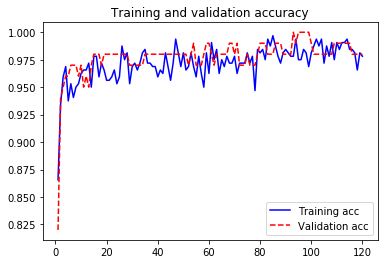

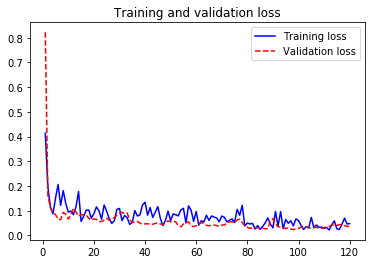

In [29]:

acc = history_vgg16.history['acc'] 
val_acc = history_vgg16.history['val_acc'] 
loss = history_vgg16.history['loss'] 
val_loss = history_vgg16.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [188]:
predicts_vgg16= model_vgg16.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

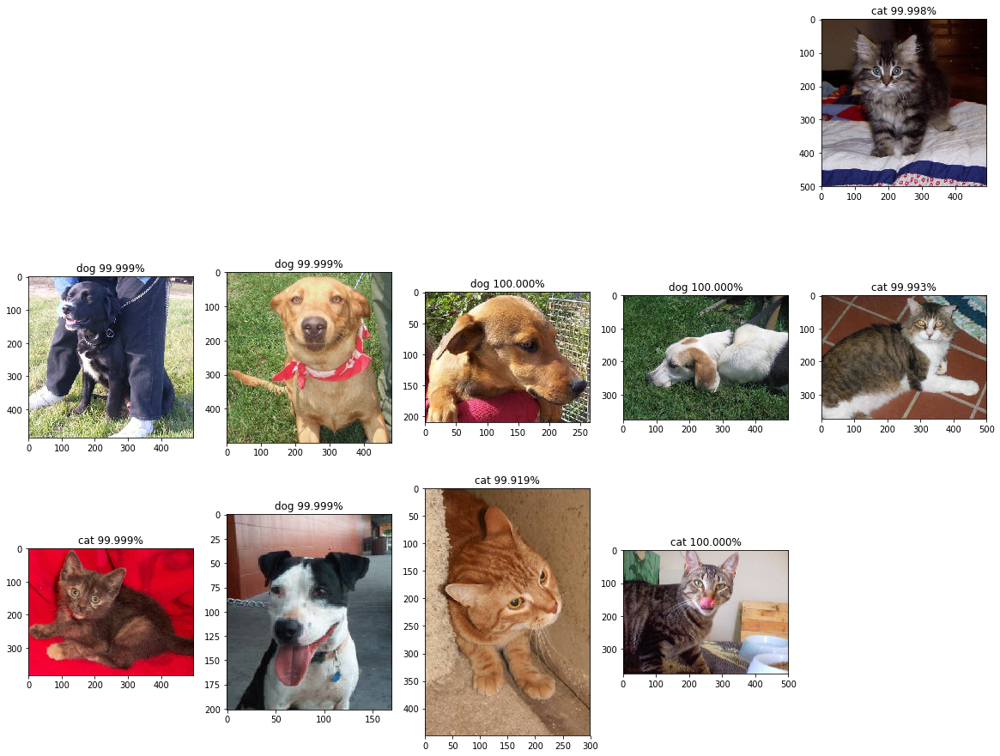

In [190]:
fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_vgg16[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [191]:
with open('submit_model_vgg16.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files,predicts_vgg16):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

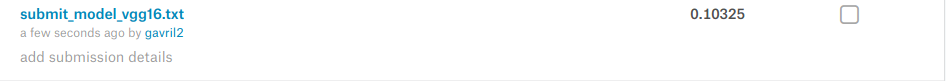

In [192]:
# Вот уже неплохо
from IPython.display import Image
Image('submit_vgg16.png')

### попробуем переобучить послений свлой свертки

In [30]:
model_vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7, 512)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               12845568  
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 513       
Total para

In [34]:
vgg16.trainable = False
trainable = False
for layer in vgg16.layers:
    print('before',layer.name,layer.trainable)
    if layer.name == 'block5_conv1':
        trainable = True
    if trainable :
        
        layer.trainable = True  
    else: 
        layer.trainable = False   
    print('After',layer.name,layer.trainable)
    print('________________________')

before input_1 False
After input_1 False
________________________
before block1_conv1 False
After block1_conv1 False
________________________
before block1_conv2 False
After block1_conv2 False
________________________
before block1_pool False
After block1_pool False
________________________
before block2_conv1 False
After block2_conv1 False
________________________
before block2_conv2 False
After block2_conv2 False
________________________
before block2_pool False
After block2_pool False
________________________
before block3_conv1 False
After block3_conv1 False
________________________
before block3_conv2 False
After block3_conv2 False
________________________
before block3_conv3 False
After block3_conv3 False
________________________
before block3_pool False
After block3_pool False
________________________
before block4_conv1 False
After block4_conv1 False
________________________
before block4_conv2 False
After block4_conv2 False
________________________
before block4_conv3 False
Af

In [53]:
model_vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7, 512)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               12845568  
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 513       
Total para

In [45]:
model_vgg16.compile(optimizer='adam', 
              loss='binary_crossentropy',  # функция потерь binary_crossentropy (log loss
              metrics=['accuracy'])

In [54]:
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_vgg16 = model_vgg16.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 3s 283ms/step - loss: 0.5467 - acc: 0.8406 - val_loss: 1.1738 - val_acc: 0.8900
Epoch 2/120
10/10 [==============================] - 2s 151ms/step - loss: 0.2537 - acc: 0.9031 - val_loss: 2.8659 - val_acc: 0.7500
Epoch 3/120
10/10 [==============================] - 2s 151ms/step - loss: 0.1960 - acc: 0.9031 - val_loss: 0.3782 - val_acc: 0.9200
Epoch 4/120
10/10 [==============================] - 2s 151ms/step - loss: 0.1875 - acc: 0.9344 - val_loss: 0.3624 - val_acc: 0.9500
Epoch 5/120
10/10 [==============================] - 2s 151ms/step - loss: 0.1636 - acc: 0.9375 - val_loss: 1.2606 - val_acc: 0.8300
Epoch 6/120
10/10 [==============================] - 2s 150ms/step - loss: 0.1411 - acc: 0.9469 - val_loss: 0.1974 - val_acc: 0.9300
Epoch 7/120
10/10 [==============================] - 2s 151ms/step - loss: 0.1522 - acc: 0.9469 - val_loss: 0.3064 - val_acc: 0.9300
Epoch 8/120
10/10 [==============================] - 2s 153ms/step - 

10/10 [==============================] - 2s 153ms/step - loss: 0.0774 - acc: 0.9750 - val_loss: 0.0509 - val_acc: 0.9600
Epoch 63/120
10/10 [==============================] - 2s 156ms/step - loss: 0.1056 - acc: 0.9563 - val_loss: 0.2352 - val_acc: 0.9300
Epoch 64/120
10/10 [==============================] - 2s 153ms/step - loss: 0.1013 - acc: 0.9625 - val_loss: 0.0645 - val_acc: 0.9800
Epoch 65/120
10/10 [==============================] - 2s 156ms/step - loss: 0.0842 - acc: 0.9812 - val_loss: 0.0807 - val_acc: 0.9600
Epoch 66/120
10/10 [==============================] - 2s 156ms/step - loss: 0.0651 - acc: 0.9719 - val_loss: 0.0958 - val_acc: 0.9500
Epoch 67/120
10/10 [==============================] - 1s 150ms/step - loss: 0.0484 - acc: 0.9844 - val_loss: 0.0639 - val_acc: 0.9800
Epoch 68/120
10/10 [==============================] - 1s 149ms/step - loss: 0.0290 - acc: 0.9875 - val_loss: 0.0759 - val_acc: 0.9700
Epoch 69/120
10/10 [==============================] - 2s 150ms/step - loss:

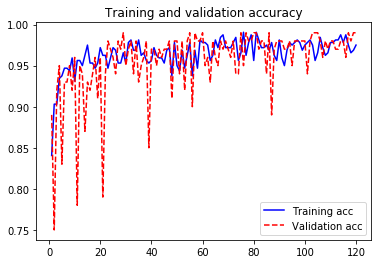

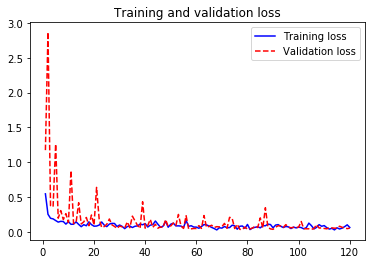

In [55]:

acc = history_vgg16.history['acc'] 
val_acc = history_vgg16.history['val_acc'] 
loss = history_vgg16.history['loss'] 
val_loss = history_vgg16.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [56]:
predicts_vgg16_tune= model_vgg16.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

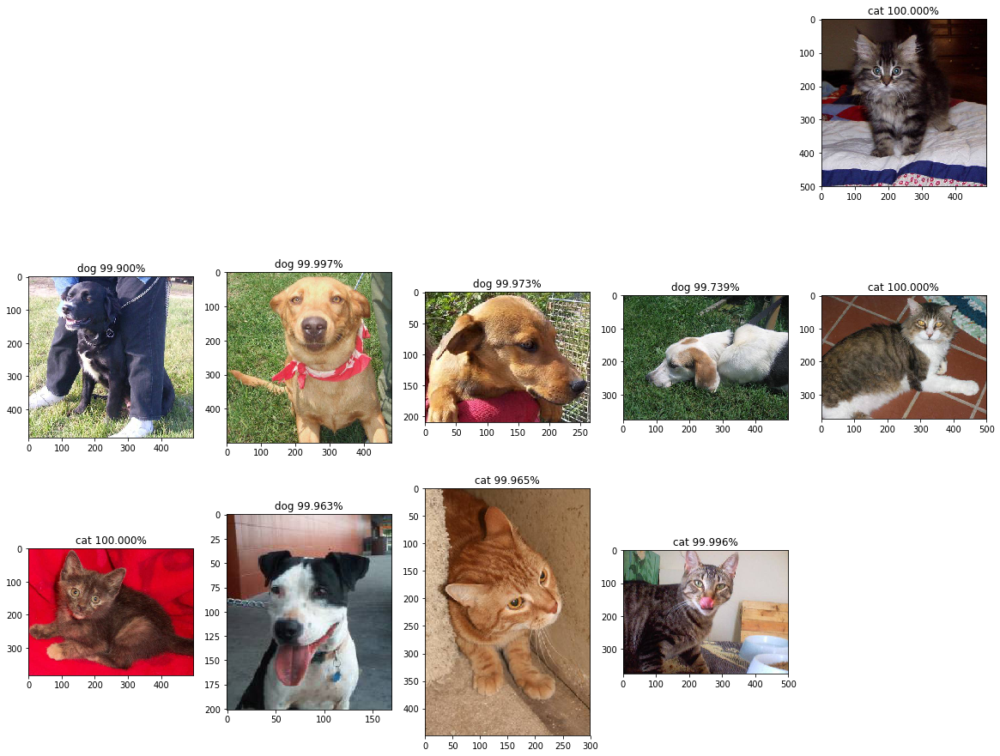

In [57]:
fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_vgg16_tune[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [58]:
with open('submit_model_vgg16_tune.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files,predicts_vgg16_tune):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

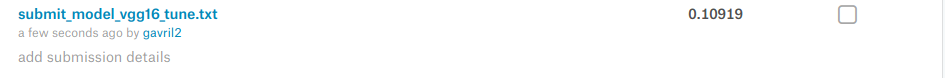

In [59]:
#доубочение слоя свертки результы не улучшило
from IPython.display import Image
Image('model_vgg16_tune.png')

## ResNet50

In [7]:
from keras.applications import ResNet50

In [8]:
resnet50 = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

/home/gavril/.local/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [9]:

resnet50.trainable = False

In [10]:
resnet50.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [19]:
model_resnet50 = ks.models.Sequential()

In [11]:

resnet50.trainable = False

In [21]:
from keras.layers import Dense, Dropout, Flatten, Activation, BatchNormalization, regularizers
from keras import layers
model_resnet50 = ks.models.Sequential()
model_resnet50.add(resnet50)
model_resnet50.add(layers.Dropout(0.5))
model_resnet50.add(Flatten())
model_resnet50.add(Dense(512, activation='relu'))
model_resnet50.add(BatchNormalization())
model_resnet50.add(Dropout(0.5))
model_resnet50.add(Dense(1, activation='sigmoid'))



In [22]:
model_resnet50.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
dropout_3 (Dropout)          (None, 7, 7, 2048)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_3 (Dense)              (None, 512)               51380736  
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_4 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 513       
Total para

In [23]:
model_resnet50.compile(loss = 'binary_crossentropy',
              optimizer = optimizers.Adam(lr=1e-5), 
              metrics=['acc'])

In [24]:


# запускаем процесс обучения
shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_model_resnet50  = model_resnet50.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 6s 607ms/step - loss: 0.7173 - acc: 0.6625 - val_loss: 0.4089 - val_acc: 0.8000
Epoch 2/120
10/10 [==============================] - 1s 126ms/step - loss: 0.3823 - acc: 0.8187 - val_loss: 0.2316 - val_acc: 0.9300
Epoch 3/120
10/10 [==============================] - 1s 126ms/step - loss: 0.3878 - acc: 0.8344 - val_loss: 0.1962 - val_acc: 0.9300
Epoch 4/120
10/10 [==============================] - 1s 124ms/step - loss: 0.3212 - acc: 0.8781 - val_loss: 0.2042 - val_acc: 0.9400
Epoch 5/120
10/10 [==============================] - 1s 130ms/step - loss: 0.1822 - acc: 0.9281 - val_loss: 0.2099 - val_acc: 0.9500
Epoch 6/120
10/10 [==============================] - 1s 131ms/step - loss: 0.1952 - acc: 0.9062 - val_loss: 0.2102 - val_acc: 0.9500
Epoch 7/120
10/10 [==============================] - 1s 130ms/step - loss: 0.1426 - acc: 0.9344 - val_loss: 0.2134 - val_acc: 0.9300
Epoch 8/120
10/10 [==============================] - 1s 131ms/step - 

10/10 [==============================] - 1s 140ms/step - loss: 0.0616 - acc: 0.9750 - val_loss: 0.1039 - val_acc: 0.9500
Epoch 63/120
10/10 [==============================] - 1s 136ms/step - loss: 0.0978 - acc: 0.9594 - val_loss: 0.1023 - val_acc: 0.9500
Epoch 64/120
10/10 [==============================] - 1s 137ms/step - loss: 0.1229 - acc: 0.9500 - val_loss: 0.1038 - val_acc: 0.9500
Epoch 65/120
10/10 [==============================] - 1s 145ms/step - loss: 0.0784 - acc: 0.9625 - val_loss: 0.1035 - val_acc: 0.9500
Epoch 66/120
10/10 [==============================] - 1s 143ms/step - loss: 0.0613 - acc: 0.9688 - val_loss: 0.0963 - val_acc: 0.9500
Epoch 67/120
10/10 [==============================] - 2s 151ms/step - loss: 0.1485 - acc: 0.9469 - val_loss: 0.0953 - val_acc: 0.9600
Epoch 68/120
10/10 [==============================] - 1s 142ms/step - loss: 0.1109 - acc: 0.9563 - val_loss: 0.0991 - val_acc: 0.9400
Epoch 69/120
10/10 [==============================] - 1s 134ms/step - loss:

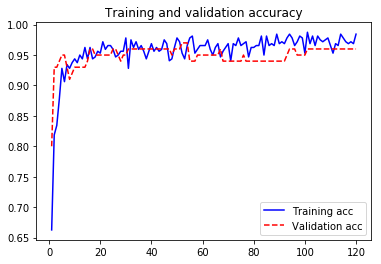

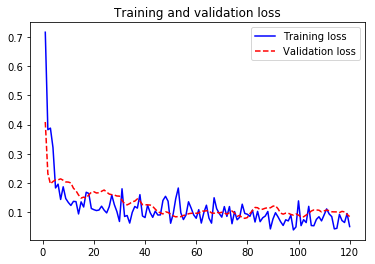

In [25]:
acc = history_model_resnet50.history['acc'] 
val_acc = history_model_resnet50.history['val_acc'] 
loss = history_model_resnet50.history['loss'] 
val_loss = history_model_resnet50.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [26]:
predicts_resnet50= model_resnet50.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

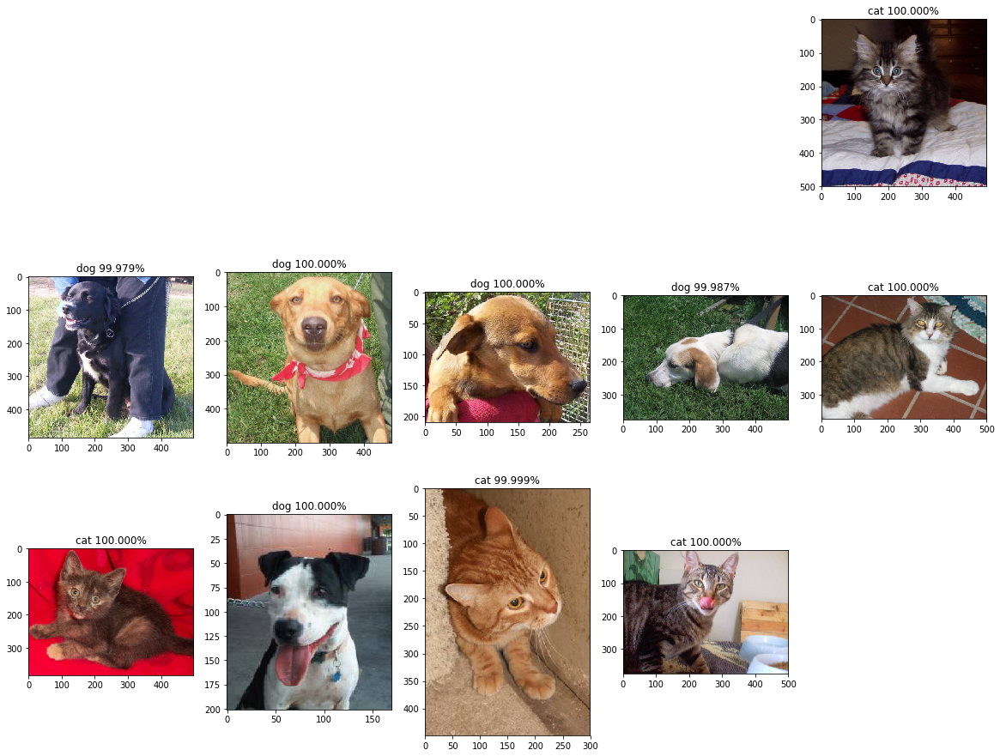

In [27]:
fig = plt.figure(figsize=(20, 20))
for i, (path, score) in enumerate(zip(test_files[80:][:10], predicts_resnet50[80:][:10]), 1):
    subplot = fig.add_subplot(i // 5 + 1, 5, i)
    if score < 0.5:
        plt.title('cat %.3f%%' % (100 - score * 100))
    else:
        plt.title('dog %.3f%%' % (score * 100))
    plt.imshow(plt.imread(path));

In [28]:
with open('submit_model_resnet50.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files,predicts_resnet50):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

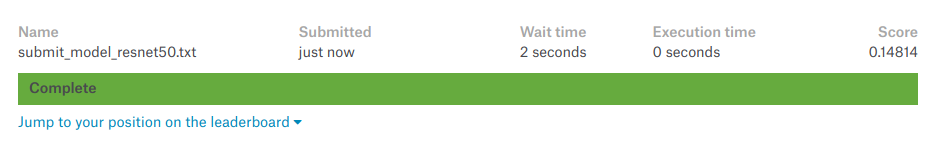

In [29]:
#resnet обобщается похуже
from IPython.display import Image
Image('submit_model_resnet50.png')

### Попробуем что-нибудь потюнинговать

In [30]:
resnet50.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [ ]:
res4f_branch2b

In [39]:
resnet50.trainable = False
trainable = False
for layer in resnet50.layers:
    #print('before',layer.name,layer.trainable)
    if layer.name == 'res4f_branch2b':
        trainable = True
    if trainable :
        
        layer.trainable = True  
    else: 
        layer.trainable = False   
    #print('After',layer.name,layer.trainable)
    #print('________________________')

In [42]:
resnet50.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [43]:
model_resnet50.compile(loss = 'binary_crossentropy',
              optimizer = optimizers.Adam(lr=1e-5), 
              metrics=['acc'])

In [44]:

shuffle(train_files)  # перемешиваем обучающую выборку

train_val_split = 100  # число изображений в валидационной выборке

validation_data = next(fit_generator(train_files[:train_val_split], train_val_split))

# запускаем процесс обучения
history_resnet50_tune = model_resnet50.fit_generator(fit_generator(train_files[train_val_split:]),  # данные читаем функцией-генератором
        steps_per_epoch=10,  # число вызовов генератора за эпоху
        epochs=120,  # число эпох обучения
        validation_data=validation_data)

Epoch 1/120
10/10 [==============================] - 10s 961ms/step - loss: 0.0454 - acc: 0.9781 - val_loss: 0.0503 - val_acc: 0.9900
Epoch 2/120
10/10 [==============================] - 2s 167ms/step - loss: 0.0808 - acc: 0.9812 - val_loss: 0.0462 - val_acc: 0.9900
Epoch 3/120
10/10 [==============================] - 2s 164ms/step - loss: 0.0895 - acc: 0.9594 - val_loss: 0.0397 - val_acc: 0.9900
Epoch 4/120
10/10 [==============================] - 2s 165ms/step - loss: 0.0598 - acc: 0.9812 - val_loss: 0.0404 - val_acc: 0.9900
Epoch 5/120
10/10 [==============================] - 2s 162ms/step - loss: 0.0686 - acc: 0.9719 - val_loss: 0.0362 - val_acc: 0.9900
Epoch 6/120
10/10 [==============================] - 2s 162ms/step - loss: 0.0913 - acc: 0.9594 - val_loss: 0.0271 - val_acc: 0.9900
Epoch 7/120
10/10 [==============================] - 2s 165ms/step - loss: 0.0580 - acc: 0.9719 - val_loss: 0.0254 - val_acc: 0.9900
Epoch 8/120
10/10 [==============================] - 2s 164ms/step -

10/10 [==============================] - 2s 168ms/step - loss: 0.0277 - acc: 0.9844 - val_loss: 0.0200 - val_acc: 0.9800
Epoch 63/120
10/10 [==============================] - 2s 166ms/step - loss: 0.0459 - acc: 0.9875 - val_loss: 0.0207 - val_acc: 0.9800
Epoch 64/120
10/10 [==============================] - 2s 162ms/step - loss: 0.0674 - acc: 0.9688 - val_loss: 0.0221 - val_acc: 0.9800
Epoch 65/120
10/10 [==============================] - 2s 163ms/step - loss: 0.0622 - acc: 0.9719 - val_loss: 0.0219 - val_acc: 0.9800
Epoch 66/120
10/10 [==============================] - 2s 163ms/step - loss: 0.0170 - acc: 0.9906 - val_loss: 0.0214 - val_acc: 0.9800
Epoch 67/120
10/10 [==============================] - 2s 164ms/step - loss: 0.0295 - acc: 0.9875 - val_loss: 0.0240 - val_acc: 0.9800
Epoch 68/120
10/10 [==============================] - 2s 167ms/step - loss: 0.0615 - acc: 0.9781 - val_loss: 0.0233 - val_acc: 0.9800
Epoch 69/120
10/10 [==============================] - 2s 171ms/step - loss:

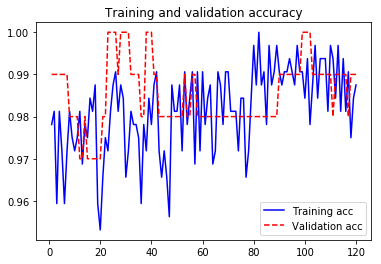

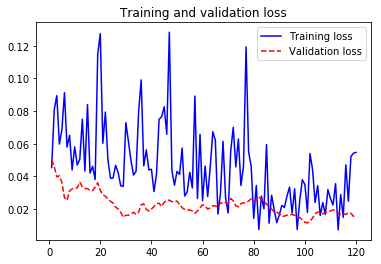

In [47]:
acc = history_resnet50_tune.history['acc'] 
val_acc = history_resnet50_tune.history['val_acc'] 
loss = history_resnet50_tune.history['loss'] 
val_loss = history_resnet50_tune.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'b', label='Training acc') 
plt.plot(epochs, val_acc, 'r--', label='Validation acc') 
plt.title('Training and validation accuracy') 
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss') 
plt.plot(epochs, val_loss, 'r--', label='Validation loss') 
plt.title('Training and validation loss') 
plt.legend()
plt.show()

In [48]:
predicts_resnet50_tune= model_resnet50.predict_generator(predict_generator(test_files), len(test_files), max_queue_size=500)

In [49]:
with open('submit_model_resnet50_tune.txt', 'w') as dst:
    dst.write('id,label\n')
    for path, score in zip(test_files,predicts_resnet50_tune):
        dst.write('%s,%f\n' % (re.search('(\d+)', path).group(0), score))

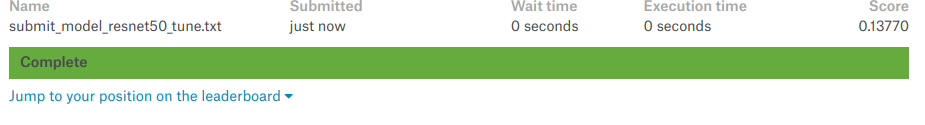

In [51]:
#Чуть-чуть ушучшлился резульатт отсноительно последнего
from IPython.display import Image
Image('submit_model_resnet50_tune.png')